# Import packages

In [1]:
import warnings
import scirpy as ir
warnings.simplefilter(action='ignore', category=FutureWarning)
from mousipy import translate
import numpy as np
import scanpy as sc
import pandas as pd
from matplotlib import pyplot as plt
import phenograph
import copy
from scipy import sparse
from sklearn.metrics import adjusted_rand_score
import seaborn as sns
import muon as mu
%matplotlib inline
from glob import glob
import anndata
sc.set_figure_params(dpi=100)
import warnings
warnings.filterwarnings('ignore')
import scprep
from statannot import add_stat_annotation

2023-10-09 09:51:22.805403: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-09 09:51:22.805426: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Import Object Concatenated

In [2]:
adata = sc.read("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/Part1_raw_data_after_QC.h5ad")

In [3]:
tmp = pd.read_csv("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/list_macro.csv",header=0,index_col=0)

In [4]:
adata = adata[~adata.obs.index.isin(tmp.index),:]

# Normalize and Log transform

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Filter CD3 positive

In [5]:
list_index = adata[adata[: , 'CD3E'].X.A > 0, :].obs.index

In [6]:
adata = adata[adata.obs.index.isin(list_index),:]

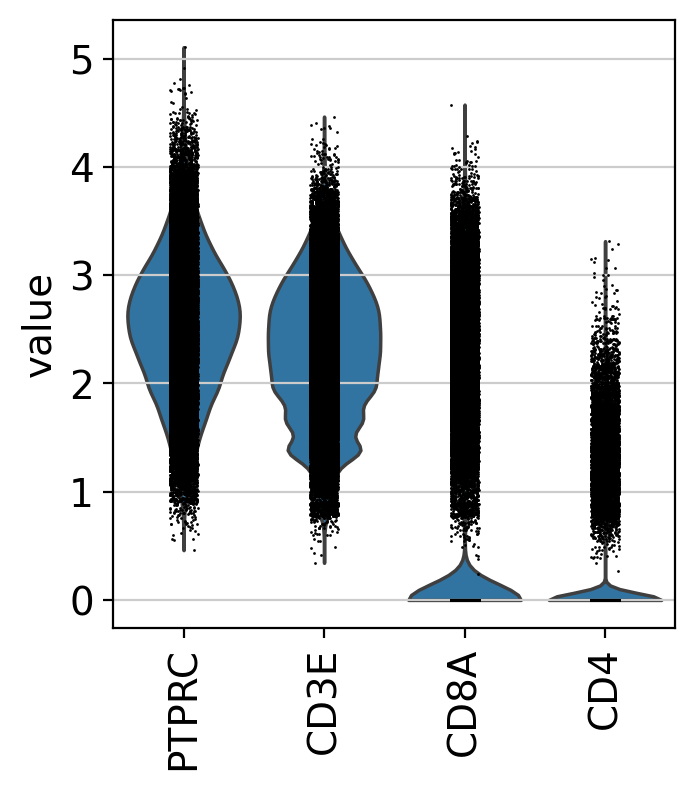

In [7]:
sc.pl.violin(adata, keys=['PTPRC','CD3E','CD8A','CD4'],  rotation=90)

# Filter Double Positive

<AxesSubplot:>

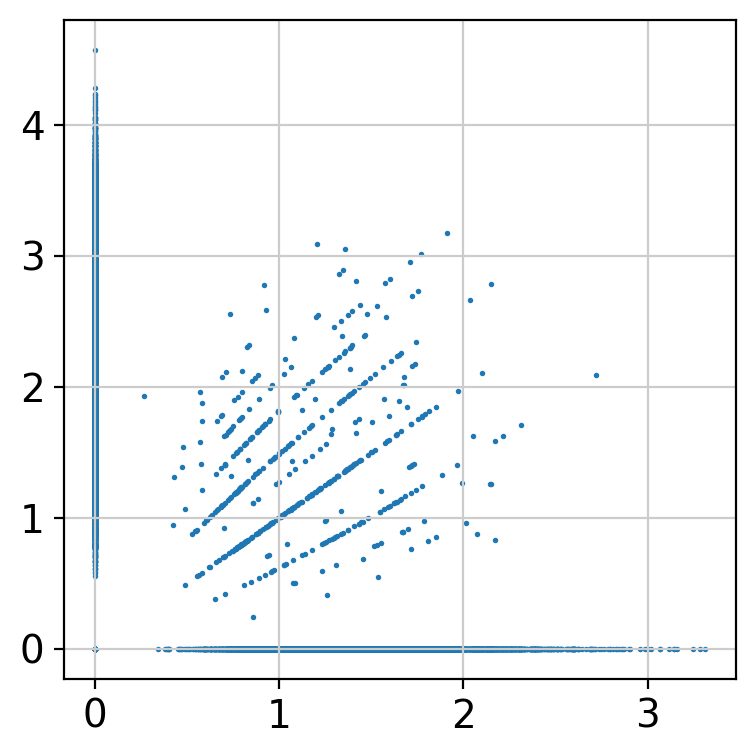

In [8]:
scprep.plot.scatter(x=adata[:, ['CD4']].to_df(),y=adata[:, ['CD8A']].to_df(),
                    legend=False)

In [9]:
list_index = adata[(adata[: , 'CD8A'].X.A > 0) & (adata[: , 'CD4'].X.A > 0), :].obs.index

In [10]:
adata = adata[~adata.obs.index.isin(list_index),:]

<AxesSubplot:>

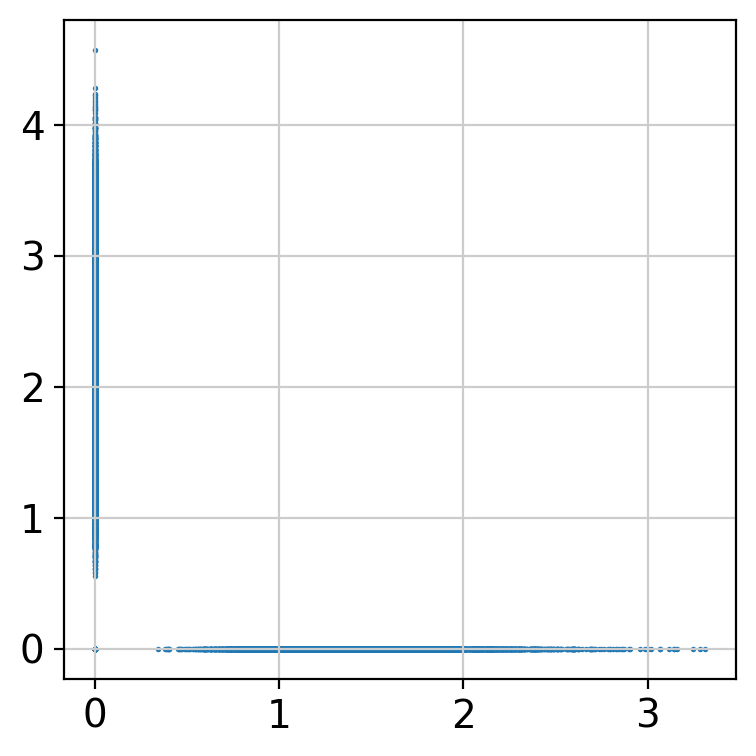

In [11]:
scprep.plot.scatter(x=adata[:, ['CD4']].to_df(),y=adata[:, ['CD8A']].to_df(),
                    legend=False)

In [12]:
list_index = adata[adata[: , 'CD4'].X.A > 0, :].obs.index

In [13]:
adata.write("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/Part2_Tcell_raw.h5ad")

In [14]:
#adata.obs['SampleID'].value_counts()

In [15]:
CD4 = adata[adata.obs.index.isin(list_index),:]

In [16]:
CD4.write("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/Part2_TcellCD4_raw.h5ad")

In [17]:
list_index = adata[adata[: , 'CD8A'].X.A > 0, :].obs.index

In [18]:
CD8 = adata[adata.obs.index.isin(list_index),:]

In [19]:
CD8.write("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/Part2_Tcell_raw.h5ad")

# Save layer

In [20]:
adata.layers['log'] =  adata.X.A

# Feature Selection

In [21]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.25)
# This saves the original set of genes 
adata.raw = adata

adata = adata[:,adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)

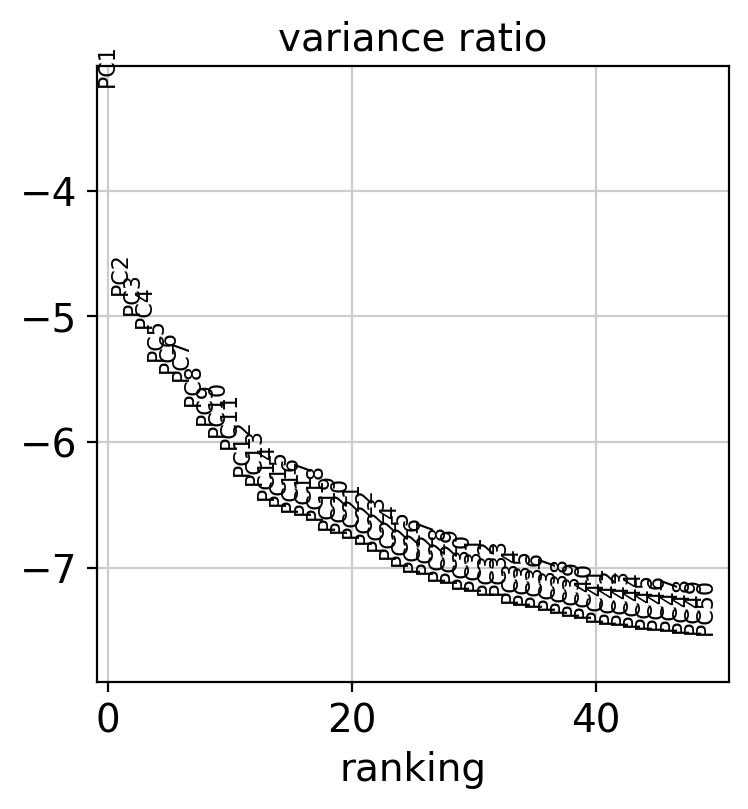

In [22]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50, save='') # scanpy generates the filename automatically

# Umap before Correction

In [23]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)
sc.tl.louvain(adata, resolution=0.5)

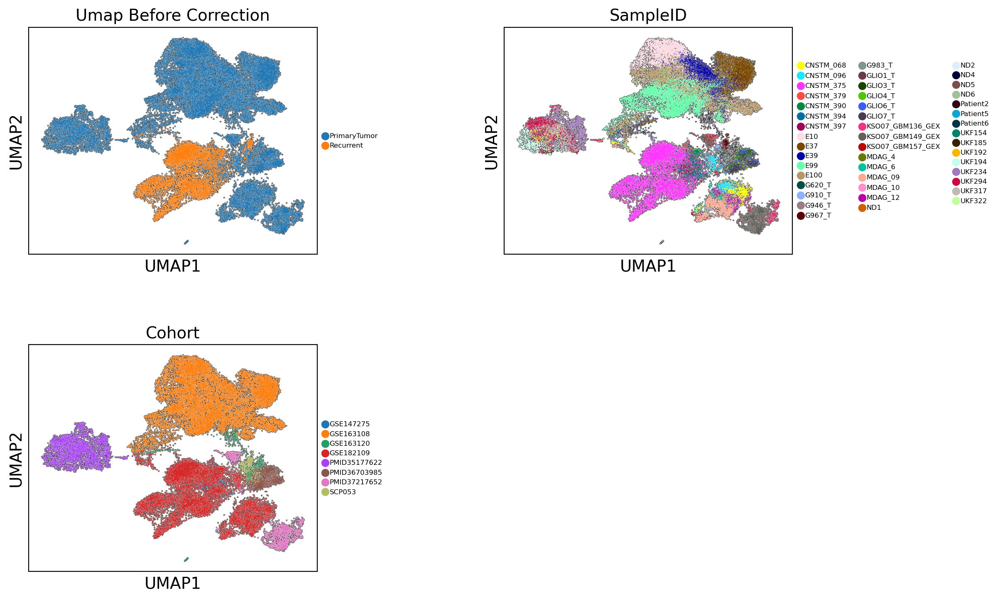

In [24]:
sc.pl.umap(adata, color=['Type','SampleID','Cohort'], legend_fontsize=6, frameon=True, ncols = 2,
                        wspace=.5, hspace=0.4,
           title="Umap Before Correction",add_outline=True)

# Harmony correction

In [25]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata, ['Type','SampleID','Cohort'])

2023-10-09 09:52:50,894 - harmonypy - INFO - Iteration 1 of 10
2023-10-09 09:53:05,425 - harmonypy - INFO - Iteration 2 of 10
2023-10-09 09:53:23,092 - harmonypy - INFO - Iteration 3 of 10
2023-10-09 09:53:40,890 - harmonypy - INFO - Iteration 4 of 10
2023-10-09 09:53:58,958 - harmonypy - INFO - Converged after 4 iterations


# Umap After Harmony Correction

In [26]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)
sc.tl.louvain(adata, resolution=0.5)

In [27]:
#sc.tl.leiden(adata, resolution=0.7)

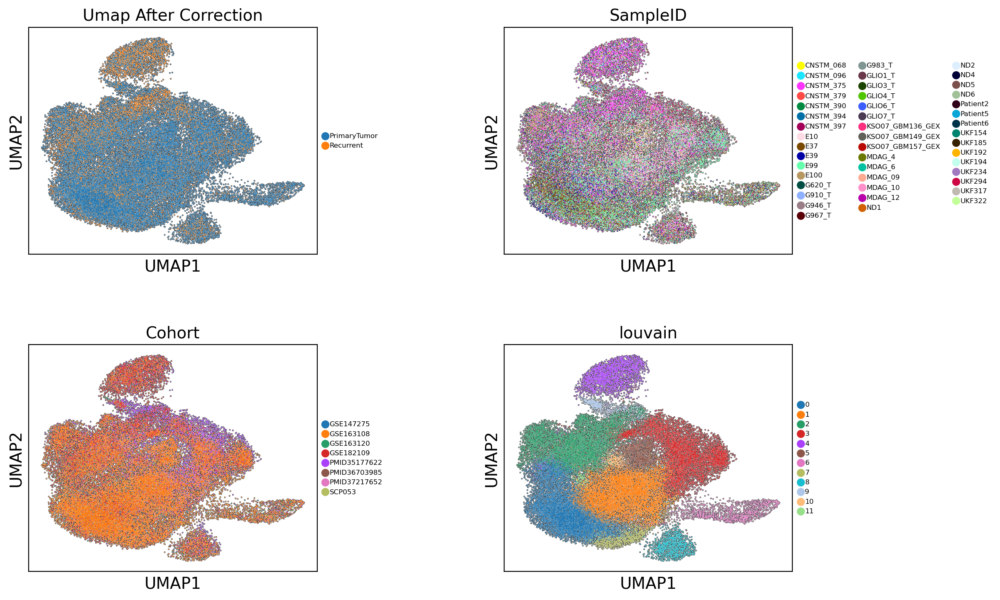

In [28]:
sc.pl.umap(adata, color=['Type','SampleID','Cohort','louvain'], legend_fontsize=6, frameon=True, ncols = 2,
                        wspace=.5, hspace=0.4, title="Umap After Correction",add_outline=True)

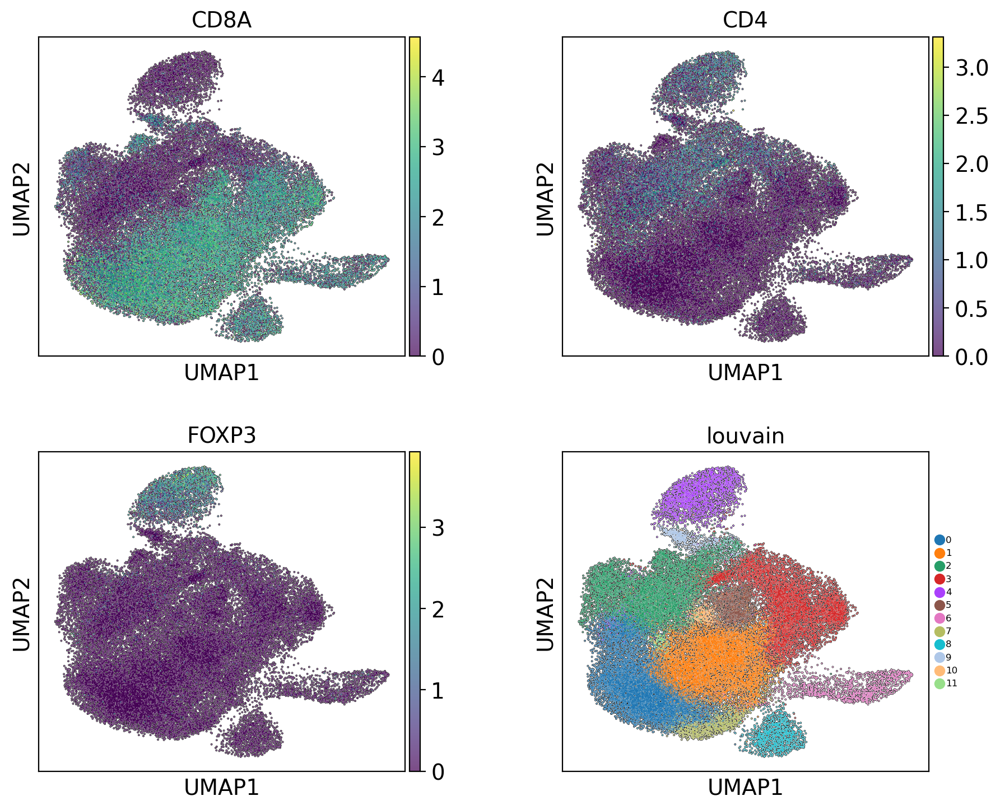

In [29]:
sc.pl.umap(adata, color=["CD8A", "CD4", "FOXP3","louvain"], legend_fontsize=6,
           frameon=True, ncols = 2,
                        wspace=.3, hspace=0.3
                        ,add_outline=True)

# Check Population

In [30]:
import celltypist
from celltypist import models

In [31]:
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 44
📂 Storing models in /home/lugli/spuccio/.celltypist/data/models
💾 Downloading model [1/44]: Immune_All_Low.pkl
💾 Downloading model [2/44]: Immune_All_High.pkl
💾 Downloading model [3/44]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [4/44]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [5/44]: Adult_Human_Skin.pkl
💾 Downloading model [6/44]: Adult_Mouse_Gut.pkl
💾 Downloading model [7/44]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [8/44]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [9/44]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [10/44]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [11/44]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [12/44]: COVID19_Immune_Landscape.pkl
💾 Downloading model [13/44]: Cells_Fetal_Lung.pkl
💾 Downloading model [14/44]: Cells_Intestinal_Tract.pkl
💾 Downloading model [15/44]: Cells_Lung_Ai

In [32]:
model = models.Model.load(model = 'Immune_All_Low.pkl')

In [33]:
predictions = celltypist.annotate(adata, model = 'Immune_All_Low.pkl', majority_voting = True,over_clustering="louvain")

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will try the `.raw` attribute
⚠️ Warning: invalid expression matrix, expect all genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 45796 cells and 16482 genes
🔗 Matching reference genes in the model
🧬 5091 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


In [34]:
adata_with_prediction = predictions.to_adata()

In [35]:
#pd.DataFrame(adata_with_prediction[adata_with_prediction.obs['majority_voting'].isin(['Macrophages']),:].obs.index).to_csv("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/list_macro.csv",header=True,index=False)


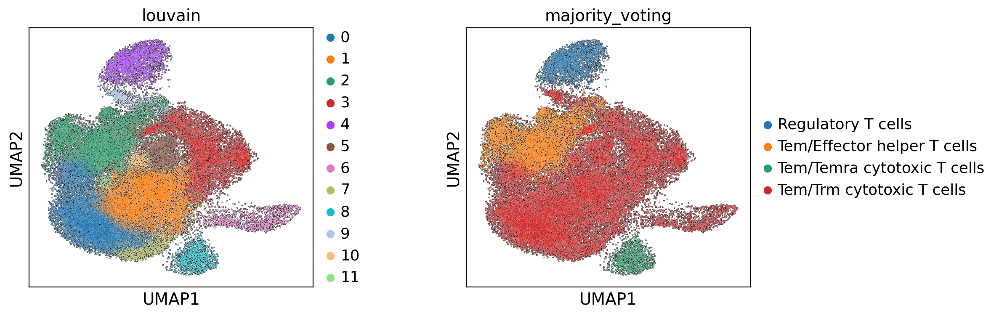

In [36]:
sc.pl.umap(adata_with_prediction, color=['louvain', 'majority_voting'],wspace=.4, hspace=0.3
                        ,add_outline=True)

In [37]:
adata.obs['SampleID'].value_counts()

CNSTM_375           8705
E99                 5605
E10                 4602
E100                4370
E37                 3981
E39                 2277
KSO07_GBM149_GEX    1866
UKF294              1668
MDAG_09             1373
UKF234              1006
CNSTM_096            897
UKF194               737
GLIO3_T              687
UKF317               641
MDAG_12              633
CNSTM_068            606
CNSTM_390            580
GLIO7_T              562
CNSTM_397            513
CNSTM_394            497
KSO07_GBM136_GEX     476
ND4                  389
GLIO6_T              336
CNSTM_379            290
G967_T               253
GLIO4_T              239
Patient6             233
KSO07_GBM157_GEX     174
ND2                  163
ND6                  143
UKF192               140
MDAG_6               111
Patient5             111
UKF322               110
UKF185               100
G910_T                99
GLIO1_T               82
ND5                   79
ND1                   74
G946_T                70


In [38]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon',pts=0.20)

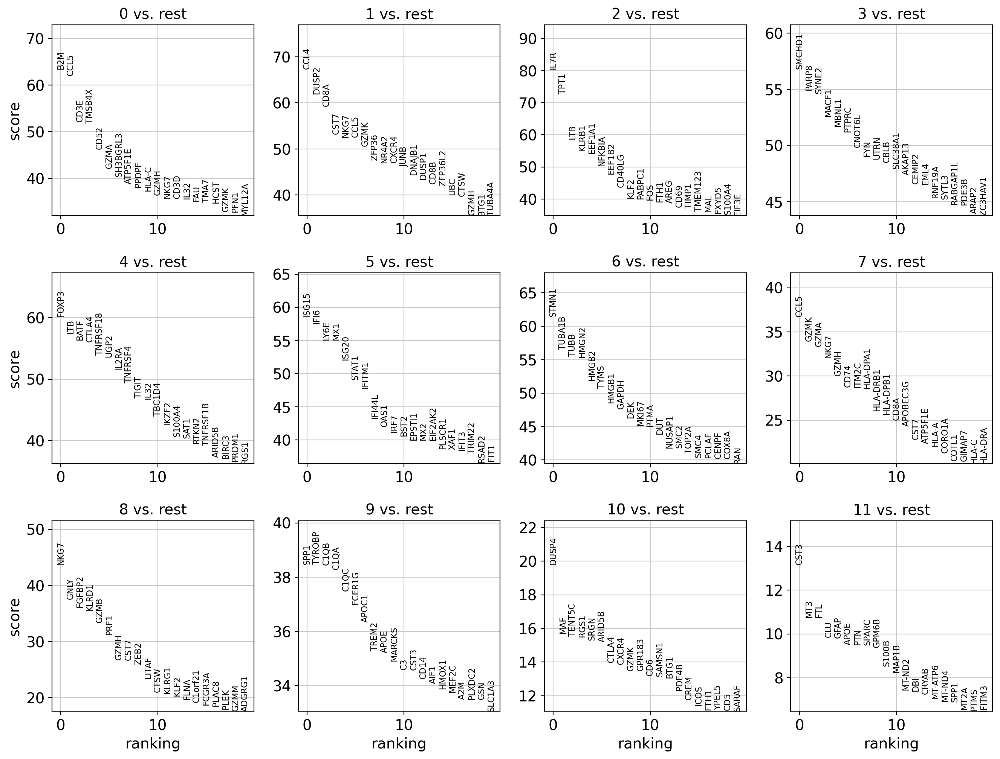

In [39]:
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

# Plot Heatmap

In [40]:
import cytocipher as cc

In [41]:
adata_all = adata.raw.to_adata()

Added data.uns['louvain_markers']
Added data.obsm['louvain_enrich_scores']


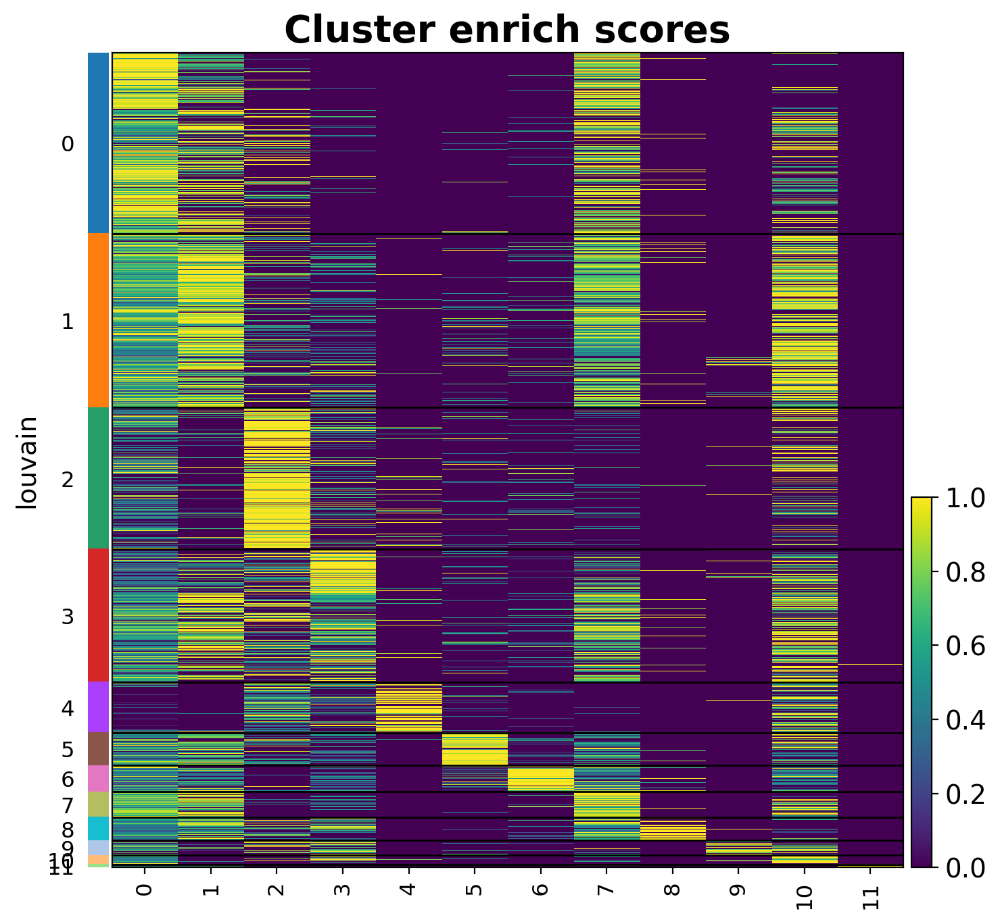

In [42]:
cc.tl.get_markers(adata_all, 'louvain')
cc.tl.code_enrich(adata_all, 'louvain')
cc.pl.enrich_heatmap(adata_all, 'louvain',n_clust_cells=None)

# Export Marker Genes

In [43]:
result = adata.uns['rank_genes_groups']

In [44]:
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/Integrated_MarkerGenes.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(adata, group=groups[_]).to_excel(writer, sheet_name=groups[_],index=False)

In [45]:
result = adata_all.uns['rank_genes_groups']

In [46]:
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/Integrated_DEGS.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(adata_all, group=groups[_]).to_excel(writer, sheet_name=groups[_],index=False)

# Plot Frequency

## Type

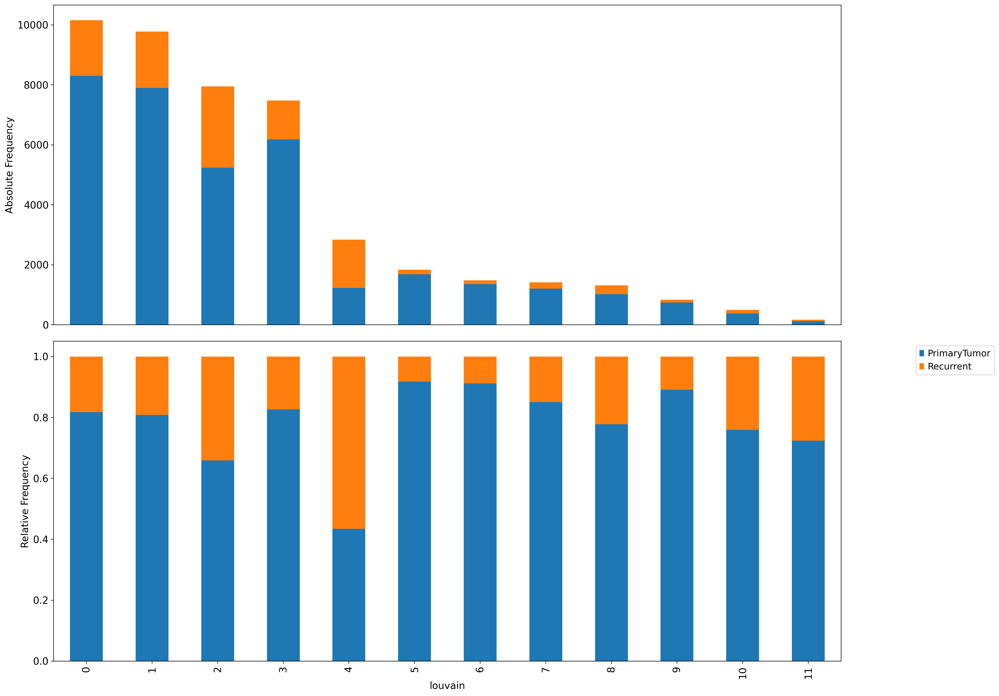

In [47]:
fig, (ax2, ax1) = plt.subplots(2, 1,figsize=(20, 14))
ax1 = adata.obs.groupby("louvain")["Type"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax2.set_xlabel(" ")
ax2.get_xaxis().set_visible(False)
ax1.set_ylabel("Relative Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.2, 1.0))
ax2 = adata.obs.groupby("louvain")["Type"].value_counts(normalize=False).unstack().plot.bar(stacked=True,legend=False,ax=ax2)
ax2.set_xlabel("Cluster")
ax2.set_ylabel("Absolute Frequency")
ax2.grid(False)
fig.tight_layout()

In [48]:
df = pd.DataFrame(adata.obs.groupby("louvain")["Type","Sample"].value_counts(normalize=True))

In [49]:
df.to_csv("./test.csv",sep="\t",header=True,index=True)

In [50]:
df2 = pd.read_csv("./test.csv",sep="\t",header=0)

In [51]:
df2 = df2.loc[df2['0']>0]

In [52]:
df2.head()

,louvain,Type,Sample,0
0,0,PrimaryTumor,Patient43,0.257458
1,0,Recurrent,Patient27,0.135965
2,0,PrimaryTumor,Patient45,0.134390
3,0,PrimaryTumor,Patient44,0.074530
4,0,PrimaryTumor,Patient46,0.057103


pairs = [
    [('0','PrimaryTumor'),('0','Recurrent')]
]

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


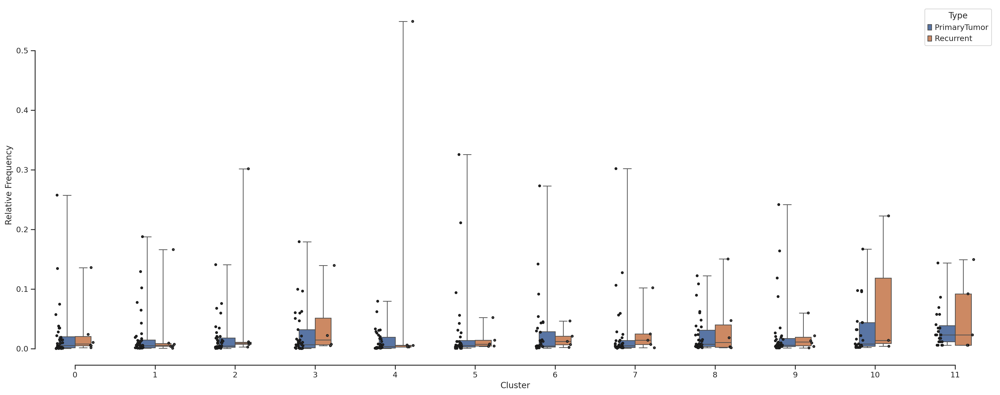

In [53]:
sns.set(rc={'font.family':'Arial', 'font.serif':'Arial'})
sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(20, 8))
ax = sns.boxplot(data=df2, x="louvain", y="0",hue="Type",hue_order=['PrimaryTumor','Recurrent'],
                 whis=[0, 100], width=.4,dodge=True)
ax = sns.stripplot(x="louvain", y="0", data=df2,hue="Type",dodge=True,legend=False,hue_order=['PrimaryTumor','Recurrent'],
              size=3, color=".3", linewidth=1)

#add_stat_annotation(ax, data=df2, x="louvain", y="0",hue="Type",
#                                   test='t-test_welch',box_pairs=pairs,
#                                   comparisons_correction=None,
#                                   loc='inside', verbose=2)

ax.xaxis.grid(False)
ax.set(ylabel="Relative Frequency")
ax.set(xlabel="Cluster")
sns.despine(trim=True, left=False)
plt.tight_layout()

## Cohort

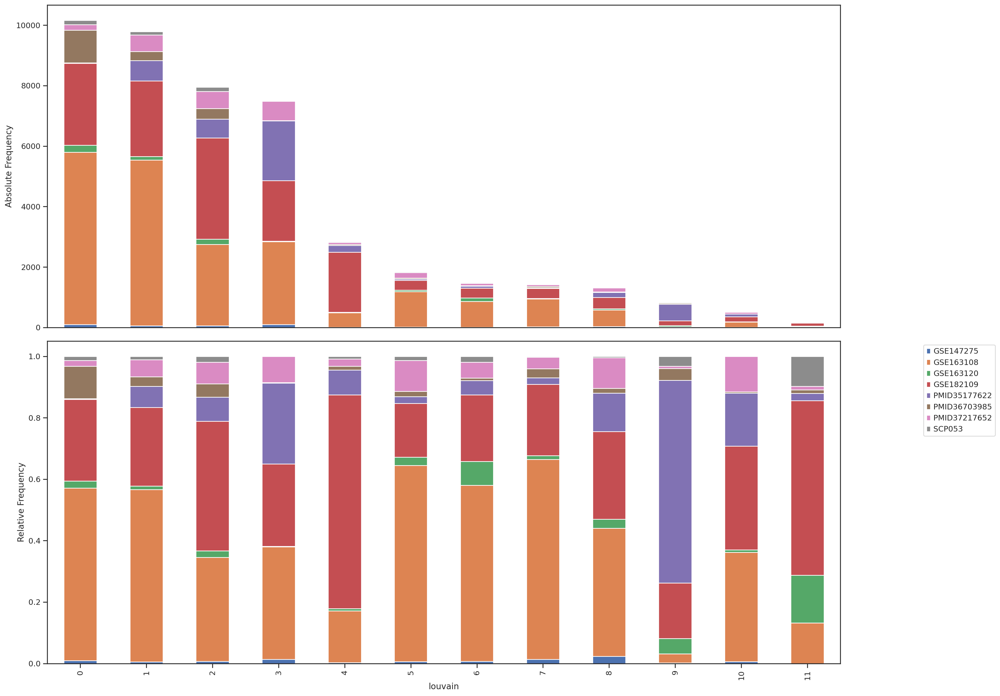

In [54]:
fig, (ax2, ax1) = plt.subplots(2, 1,figsize=(20, 14))
ax1 = adata.obs.groupby("louvain")["Cohort"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax2.set_xlabel(" ")
ax2.get_xaxis().set_visible(False)
ax1.set_ylabel("Relative Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.2, 1.0))
ax2 = adata.obs.groupby("louvain")["Cohort"].value_counts(normalize=False).unstack().plot.bar(stacked=True,legend=False,ax=ax2)
ax2.set_xlabel("Cluster")
ax2.set_ylabel("Absolute Frequency")
ax2.grid(False)
fig.tight_layout()

# SampleID

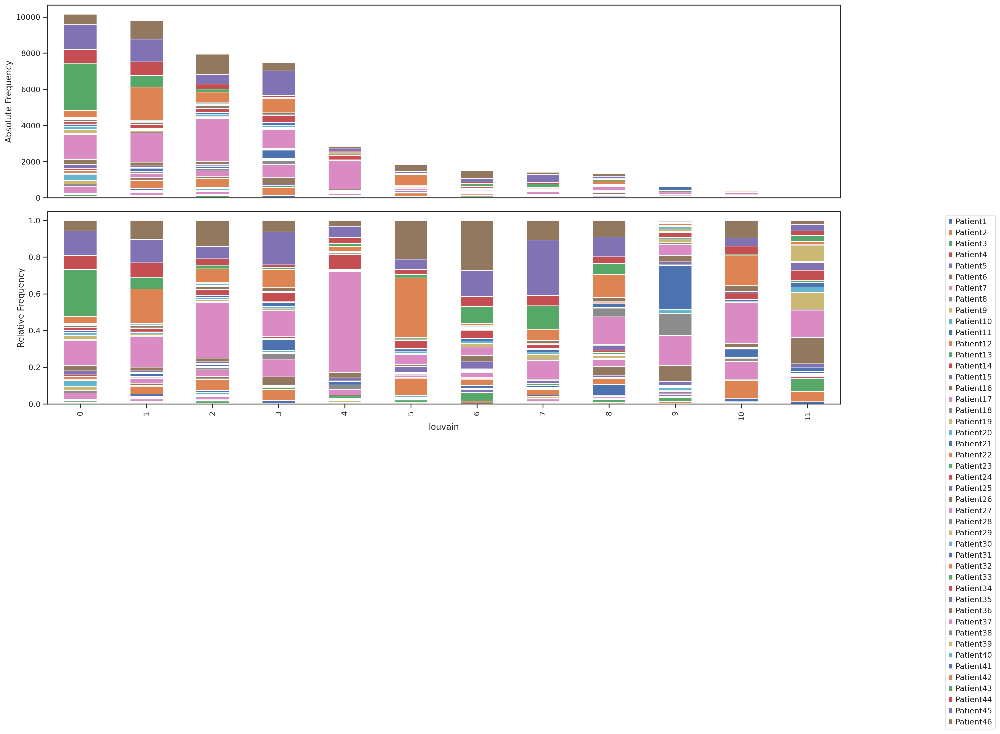

In [55]:
fig, (ax2, ax1) = plt.subplots(2, 1,figsize=(20, 14))
ax1 = adata.obs.groupby("louvain")["Sample"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax2.set_xlabel(" ")
ax2.get_xaxis().set_visible(False)
ax1.set_ylabel("Relative Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.2, 1.0))
ax2 = adata.obs.groupby("louvain")["Sample"].value_counts(normalize=False).unstack().plot.bar(stacked=True,legend=False,ax=ax2)
ax2.set_xlabel("Cluster")
ax2.set_ylabel("Absolute Frequency")
ax2.grid(False)
fig.tight_layout()

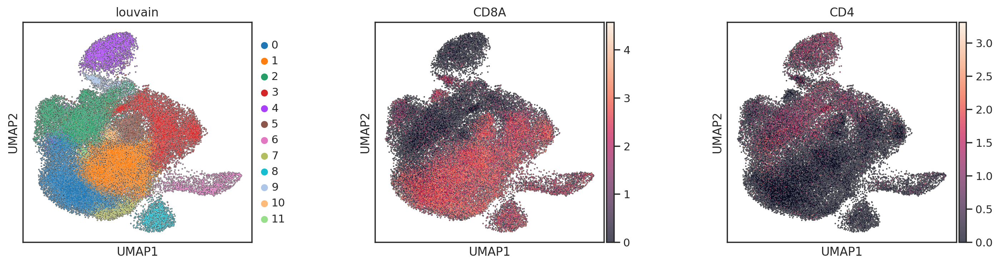

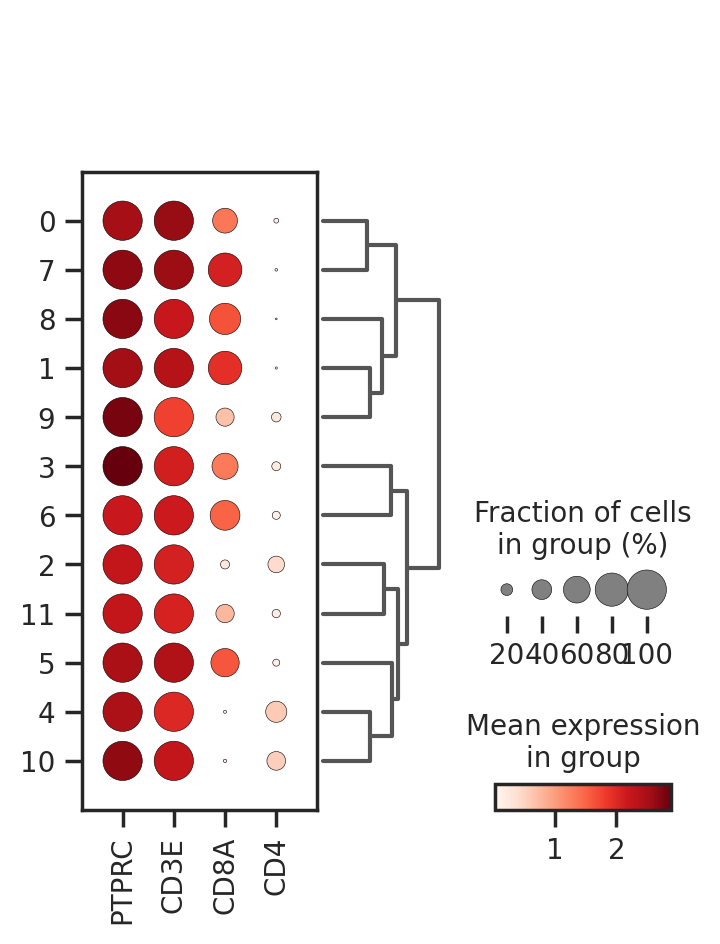

In [56]:
sc.pl.umap(adata_with_prediction, color=['louvain','CD8A','CD4'],wspace=.4, hspace=0.3,
                        add_outline=True)
sc.pl.dotplot(adata, ['PTPRC','CD3E','CD8A','CD4'],
                          groupby='louvain', swap_axes=False, dendrogram=True)

In [95]:
tmp = sc.read("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/Part1_raw_data_after_QC.h5ad")

In [96]:
treg_id = adata_all[adata_all.obs['louvain'].isin(['4']),:]

In [99]:
tmp = tmp[tmp.obs.index.isin(treg_id.obs.index),:]

In [101]:
tmp.write("/home/lugli/spuccio/Projects/SP039/GMB_revisionSept2023/H5ad/Part2_Treg.h5ad")